In [1]:
from jetstream_hugo.jet_finding import *
from jetstream_hugo.definitions import *
from jetstream_hugo.plots import *
from jetstream_hugo.clustering import *
from jetstream_hugo.data import *
import colormaps

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
exp = MultiVarExperiment("ERA5", "plev", ["u", "v", "s"], "6H", "all", None, -80, 40, 15, 80, [200, 250, 300])
all_jets_one_df, where_are_jets, all_jets_one_array, all_jets_over_time, flags = exp.track_jets(processes=N_WORKERS, chunksize=100)
props_as_ds_uncat = exp.props_as_ds(False, processes=N_WORKERS, chunksize=100)
props_as_ds = exp.props_as_ds(True)
da = exp.ds["s"]

jet_pos_da = jet_position_as_da(da, props_as_ds_uncat, all_jets_one_df, exp.path, processes=N_WORKERS, chunksize=100)
jet_pos_da = coarsen_da(jet_pos_da, 1.5)
jet_pos_da = jet_pos_da.interp(time=da.time.values)
props_as_ds["nao"] = get_nao(props_as_ds)
overlap = (jet_pos_da > 0).any("lat").all("jet")
props_as_ds["double_jet_index"] = overlap.sel(lon=slice(-20, None, None)).mean("lon")

subset = ["mean_lon", "mean_lat", "mean_lev", "width", "persistence", "int"]
props_as_np = props_as_ds[subset].sel(time=props_as_ds.time.dt.season=="JJA").to_dataarray().values
props_as_np = props_as_np.transpose(1, 0, 2).reshape(props_as_np.shape[1], props_as_np.shape[0] * props_as_np.shape[2]) 

exp_T = Experiment(
    "ERA5", "surf", "t", "6H", "all", "JJA", -30, 40, 30, 75, 250, 'hourofyear', {'hourofyear': ('win', 4 * 15)}, None,
)
da_T = exp_T.da

da_pvs = Experiment("ERA5", "surf", "pvs", "6H", "all", "JJA", *exp.region, 250, "hourofyear", {"hourofyear": ("win", 60)}).da

exp_z = Experiment(
    "ERA5", "plev", "z", "6H", "all", "JJA", *exp.region, 500, 'hourofyear', {'hourofyear': ('win', 4 * 15)}, None,
)
da_z = exp_z.da

[                                        ] | 0% Completed | 104.12 ms

/storage/homefs/hb22g102/miniforge3/envs/env11/lib/python3.11/site-packages/xarray/core/indexing.py:1593: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


[########################################] | 100% Completed | 67.80 s


In [3]:
from itertools import product
quantiles = np.nanquantile(props_as_np, q=[.05, .95], axis=0)
props_as_np_digitized = np.zeros_like(props_as_np, dtype=int)
for i, prop_as_np in enumerate(props_as_np.T):
    ouais = np.digitize(prop_as_np, quantiles[:, i])
    props_as_np_digitized[:, i] = np.digitize(prop_as_np, quantiles[:, i], right=True)
titles = [', '.join(ouais) for ouais in product(subset, props_as_ds.jet.values, ['bottom 5%', 'top 5%'])]

ncat = len(quantiles) + 1
unique_labels = np.arange(ncat)
mask_extremes = []
for i, prop_as_np in enumerate(props_as_np_digitized.T):
    masks = prop_as_np[:, None] == unique_labels[None, [0, -1]]
    mask_extremes.append(masks)
mask_extremes = np.concatenate(mask_extremes, axis=1)

## Temperature anomalies

100%|██████████| 24/24 [00:01<00:00, 12.58it/s]


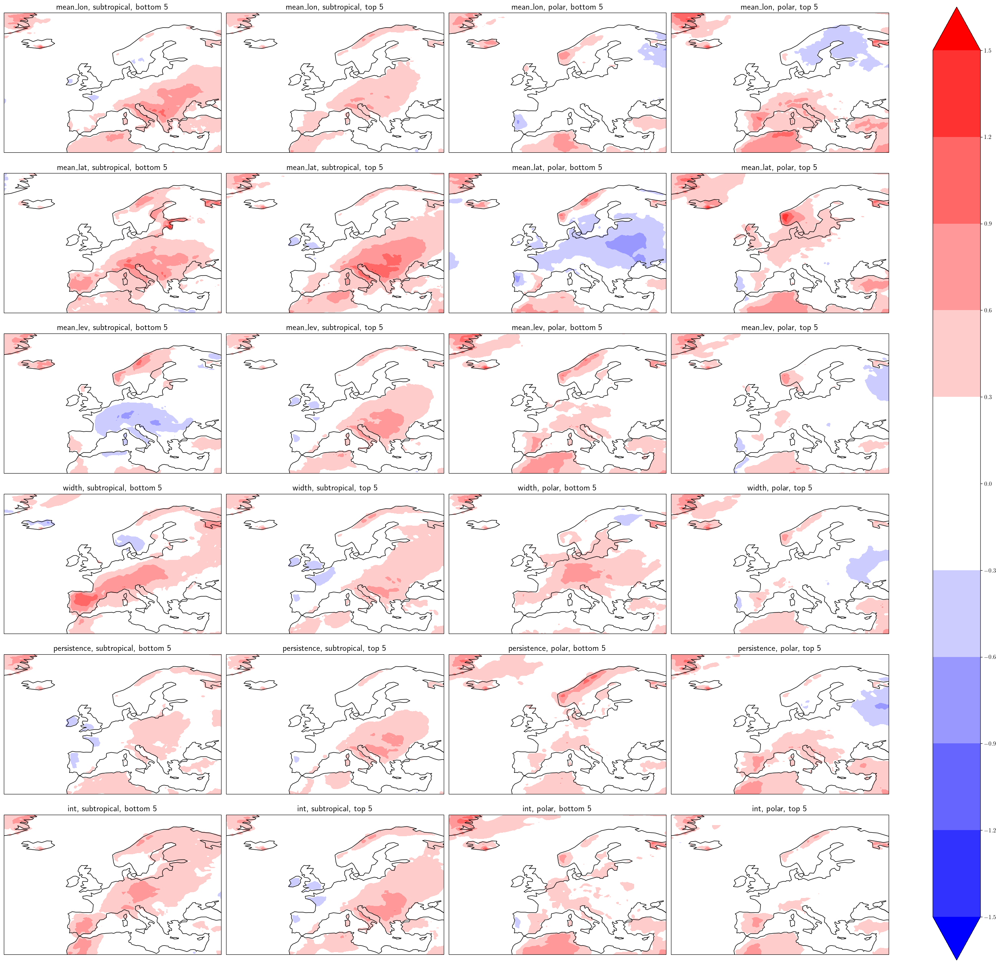

In [4]:
clu = Clusterplot(len(subset), 4, region=get_region(da_T))
_ = clu.add_any_contour_from_mask(da_T, mask_extremes, stippling=False, cmap='bwr', transparify=1, draw_cbar=True, titles=titles, q=0.999, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/jet_index_vs_temp.png')

## Jet position

In [5]:
jet_pos_da_summer = jet_pos_da.sel(time=jet_pos_da.time.dt.season=="JJA")

100%|██████████| 24/24 [00:00<00:00, 28.56it/s]


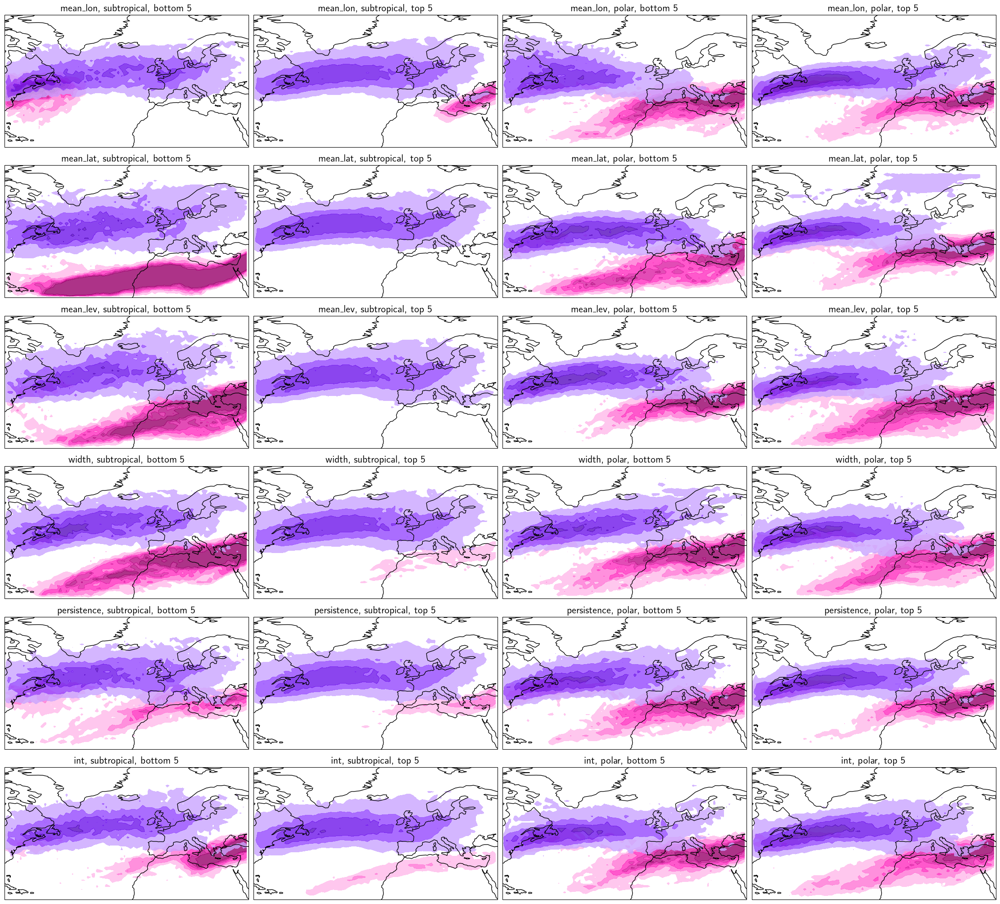

In [7]:
clu = Clusterplot(len(subset), 4, region=exp.region)
# _ = clu.add_any_contour_from_mask(da_T, mask_extremes, type='contour', cmap='bwr', clabels=True, nlevels=3, titles=titles)
# clu.resize_relative([0.85, 0.95])
_ = clu.add_any_contour_from_mask(jet_pos_da_summer[:, 0], mask_extremes, stippling=False, cmap=MYPINKS, transparify=.8, draw_cbar=False, q=0.98, titles=titles)
_ = clu.add_any_contour_from_mask(jet_pos_da_summer[:, 1], mask_extremes, stippling=False, cmap=MYPURPLES, transparify=.8, draw_cbar=False, q=0.98)
clu.resize_relative([0.85, 0.95])
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_jet_pos.png')

## Anticyclonic streamers

100%|██████████| 24/24 [00:06<00:00,  3.82it/s]


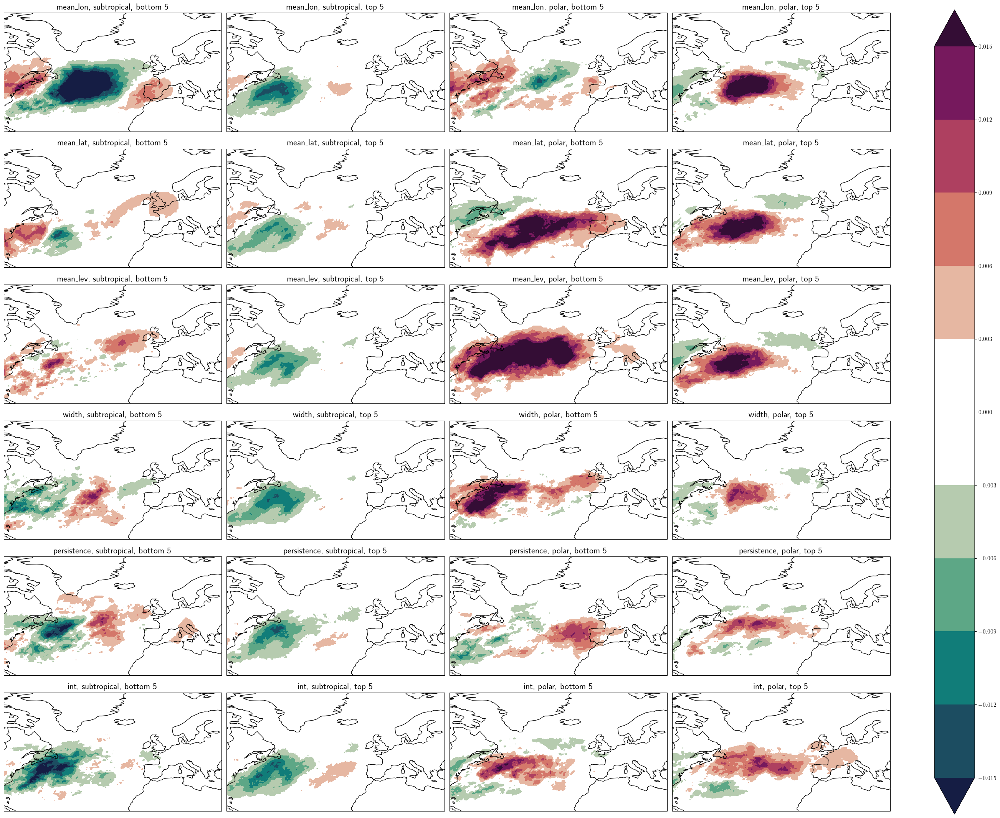

In [8]:
import warnings
clu = Clusterplot(len(subset), 4, region=get_region(da_pvs))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(da_pvs.sel(type="anti"), mask_extremes, stippling=False, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/jet_index_vs_apvs.png')

## Cyclonic streamers

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:06<00:00,  3.79it/s]


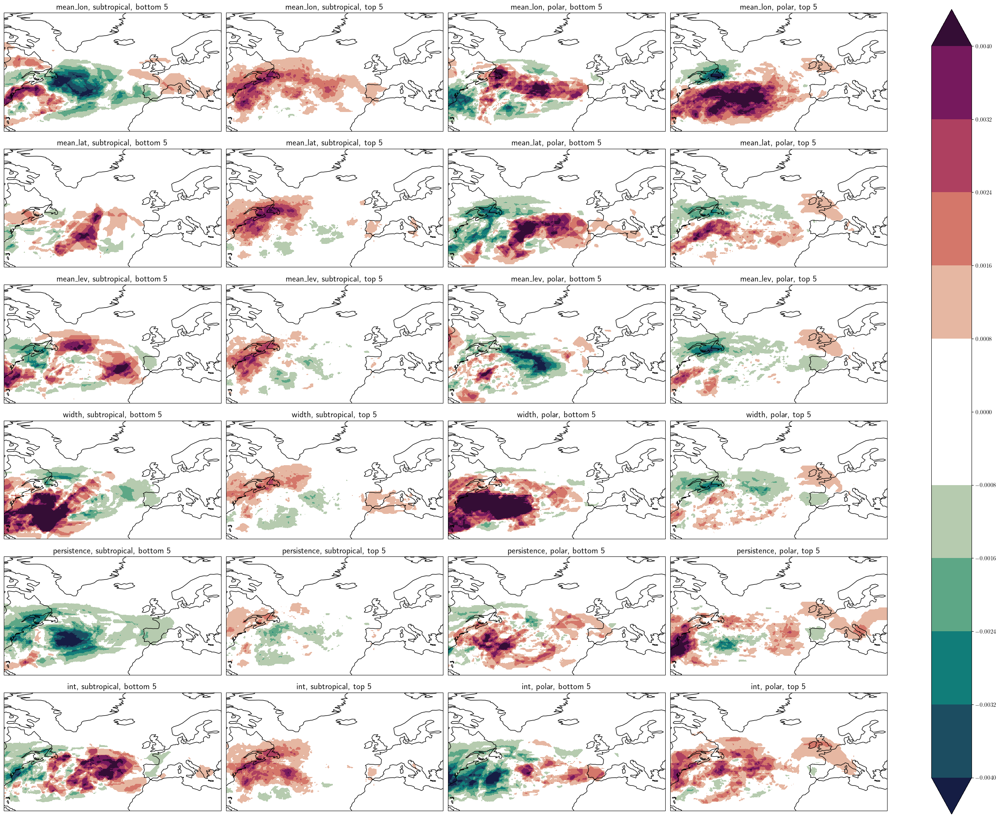

In [9]:
clu = Clusterplot(len(subset), 4, region=get_region(da_pvs))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(da_pvs.sel(type="cycl"), mask_extremes, stippling=False, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/cpvs.png')

100%|██████████| 24/24 [00:04<00:00,  5.27it/s]


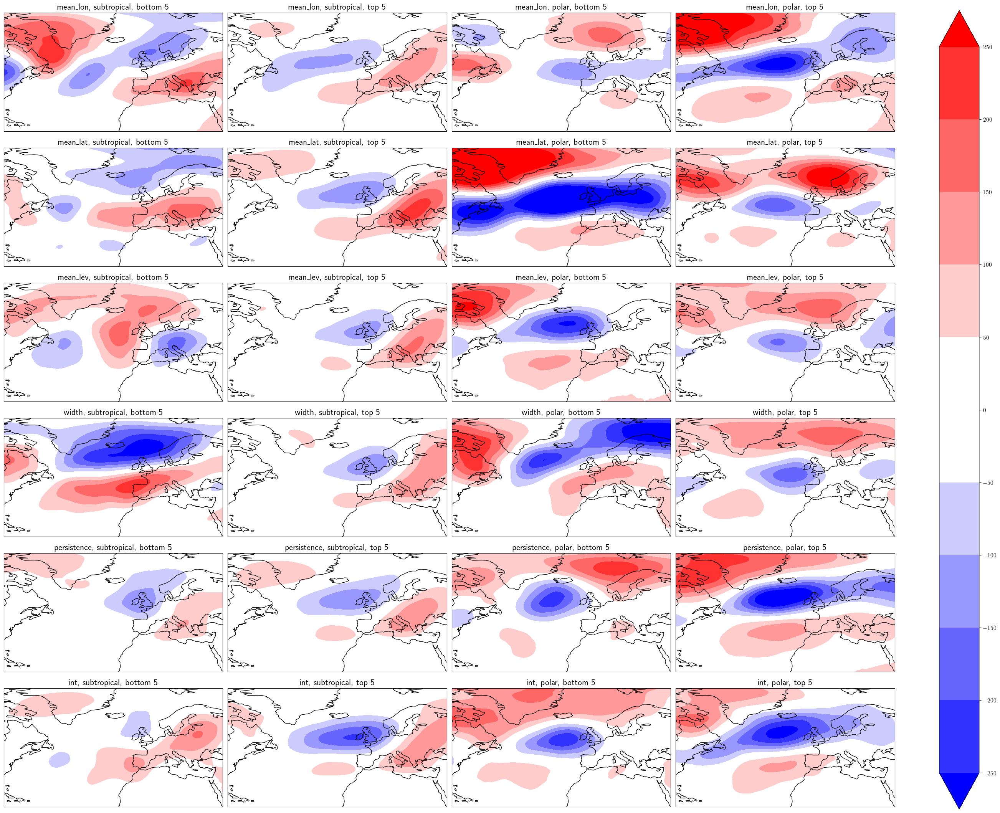

In [10]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(da_z, mask_extremes, stippling=False, cmap="bwr", transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/z.png')

# Wind components

## $u$

In [14]:
ds_summer = exp.ds.sel(time=exp.ds.time.dt.season=="JJA").load()

100%|██████████| 24/24 [00:07<00:00,  3.28it/s]


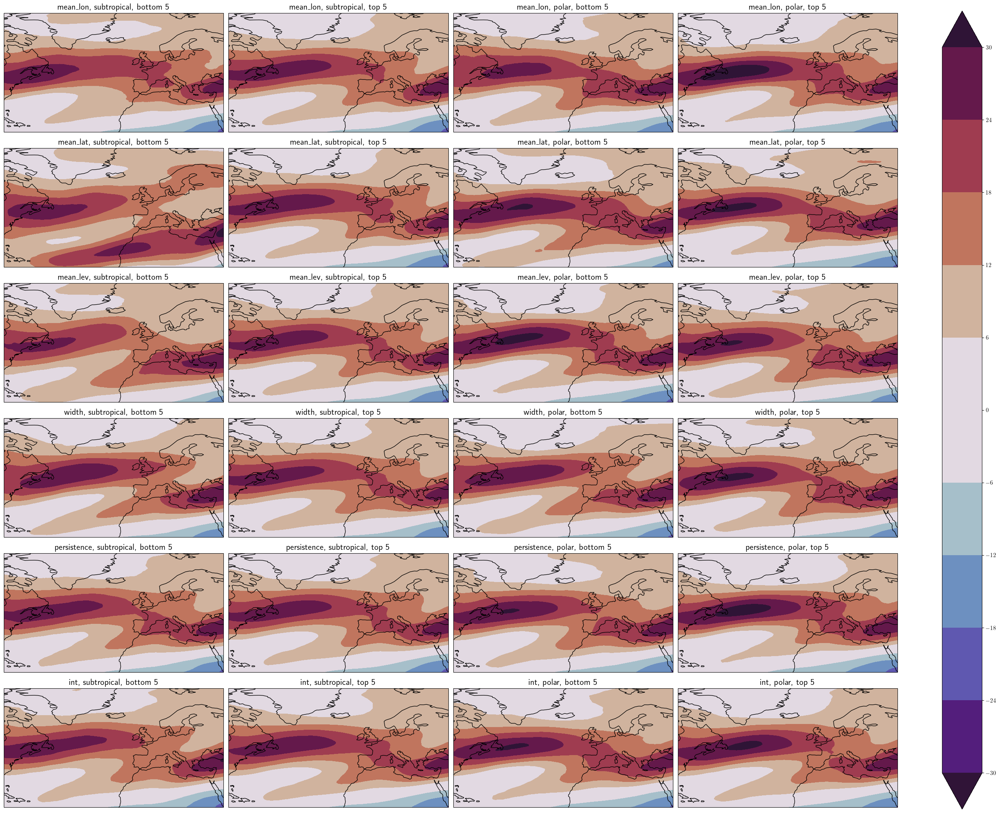

In [15]:
clu = Clusterplot(len(subset), 4, region=exp.region)
_ = clu.add_any_contour_from_mask(ds_summer["u"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=0, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/u.png')

100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


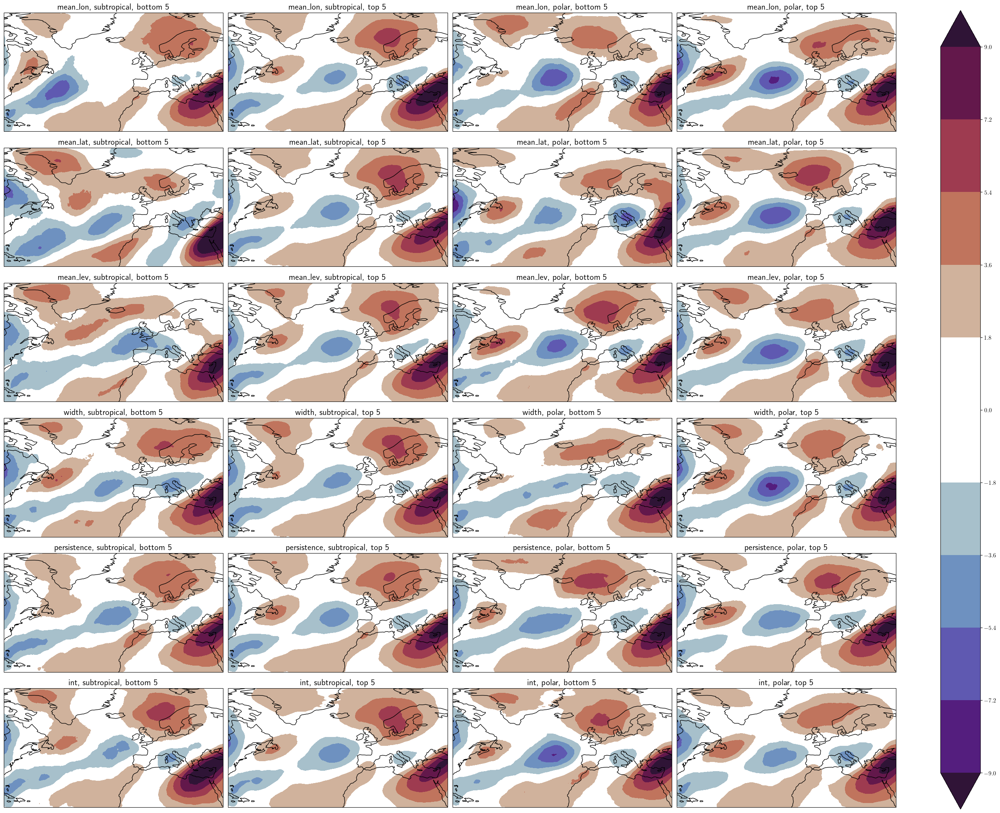

In [16]:
clu = Clusterplot(len(subset), 4, region=exp.region)
_ = clu.add_any_contour_from_mask(ds_summer["v"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/v.png')

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:04<00:00,  5.60it/s]


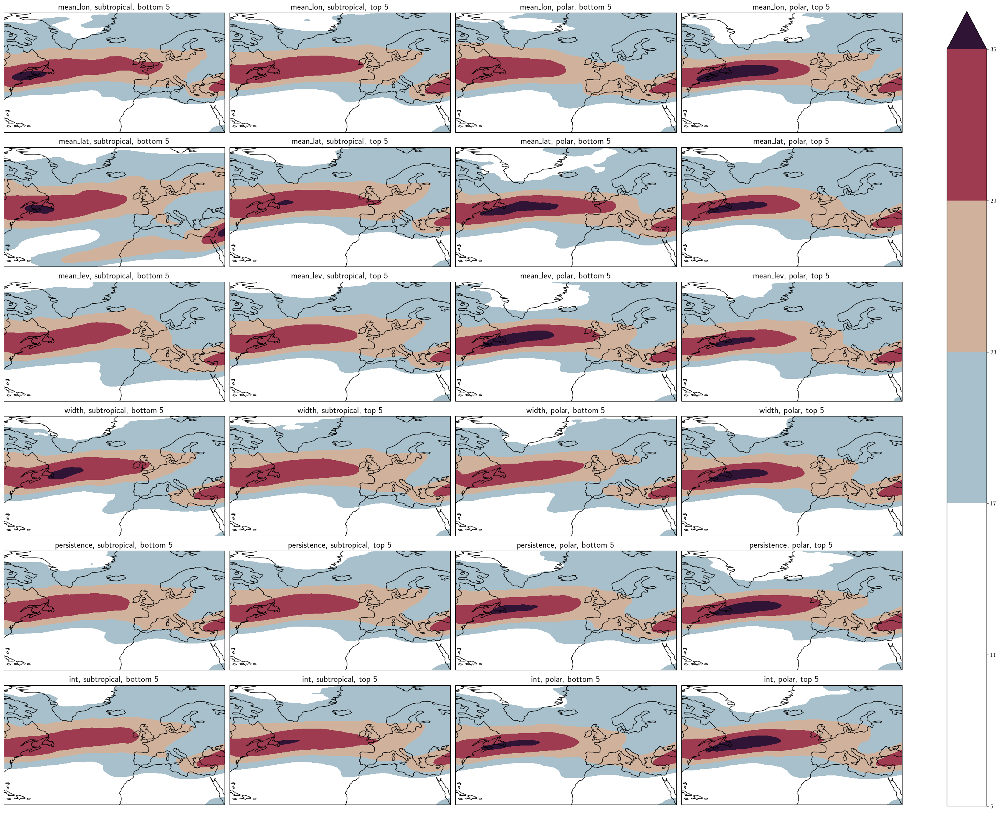

In [17]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(ds_summer["s"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=2, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/s.png')